# Single-Image Super-Resolution
Chao Feng, #35726306

## Model
I use the model FSRCNN from ["Accelerating the Super-Resolution Convolutional Neural Network"](https://arxiv.org/abs/1608.00367). The  architecture of model is shown below:

| Name      | FSRCNN |
| :---        |    :----:   |
| Extraction      | Conv(1, d, 5, 1, 2)       | 
| Srhinking   | Conv(d, s, 1, 1, 0)        |
| Non-linear Mapping   | m$\times$Conv(s, s, 3, 1, 1)        | 
| Expanding   | Conv(s, d, 1, 1, 0)        | 
| Deconvolution   | TransConv(d, 1, 9, n, 4, n - 1)        | 

The overall structure is $Conv(1, d, 5, 1, 2) - PReLU - Conv(d, s, 1, 1, 0) - PReLU - m \times (Conv(s, s, 3, 1, 1), PReLU) - Conv(s, d, 1, 1, 0) - PReLU - TransConv(d, 1, 9, n, 4, n - 1).$

I use the notation Conv(input channel, output channel, kernel size, stride, padding) and TransConv(input channel, output channel, kernel size, stride, padding, output padding). Here d, s, m are the hyperparameters. D is the number of filters in the extraction layer also the dimension of number of LR feature dimension. S is the number of filters in the shrinking layer and m is the number of layers of non-linear mapping module. n is upscaling factor.

Specifically, I set d=56, s=12 and m=4 following the paper. And the non-linear function is PReLU (For each channel, I set a learnable parameter, and the initial value is 0.25). The output of each layer except deconvolution layer will go through PReLU, which is different from original paper where for 4-layer non-linear mapping module, only the output from last layer would be fed into PReLU. Another difference is that I use output padding in the deconvolution layer, which makes the output size = input size $\times$ upscale factor. However, in the original paper, output size = input size $\times$ upscale factor - upscale factor + 1.



## Loss function
The used loss function is Mean Square Error (MSE). The training objective is $min_{\theta}\sum_{i=1}^{N}||F(\theta, LR^{(i)}) - HR^{(i)}||_{2}^{2}$, LR is low-resolution image and HR is the corresponding high-resolution image.

## Dataset
The training set used in project is 91-image dataset, and I split this dataset into training set and validation set by the train-val ratio of 9:1. The testing set is Set5 and Set14.

## Experiment

### Implementation details 

#### Training samples
During training, each high-resolution image will be downscaled with factors 0, 0.9, 0.8, 0.7, 0.6 and rotated with degree 0, 90, 180, 270 for the augmentation purpose. The low-resolution image is downscaled by upscale factors from corresponding high-resolution images. The sliding window is of patch size with step of upscale factor, and then the low-resolution patch and the corresponding high-resolution patch would be cropped by the sliding window. Upscale factors are 2, 3, and 4. For three upscaling factors, the low-resolution patch size and corresponding high-resolution patch size are 10/20, 7/21, 6/24 respectively. 

#### Training settings
The hyperparameters setting for model is mentioned in model section. The initialization way for model follows the paper ["Delving Deep into Rectifiers: Surpassing Human-Level Performance on ImageNet Classification"](https://arxiv.org/abs/1502.01852). I use the Adam optimizer, and learning rate for all layers except Deconvolution layer is 1e-3, the learning rate for deconvolution layer is 1e-4. Beta1 is 0.9 and beta2 is 0.999. There is no weight decay here. The maximum iterations for upscale factors 2, 3, and 4 are $3\times10^{6}$, $8\times10^{5}$, and $3\times10^{5}$ respectively.

### Results

#### Upscale factor 2

The training loss curve and validation PSNR curve are shown below:
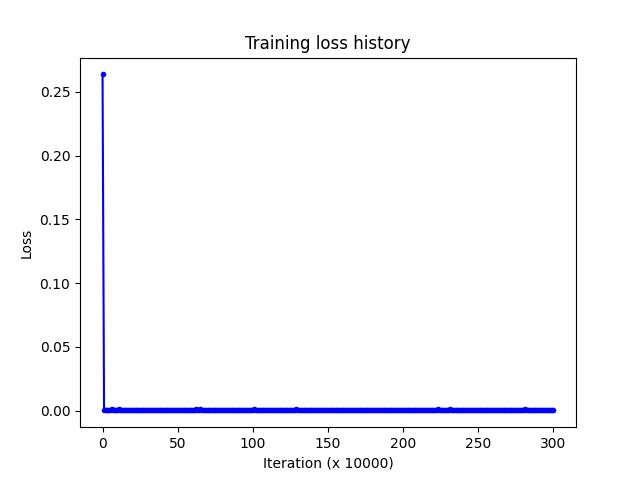

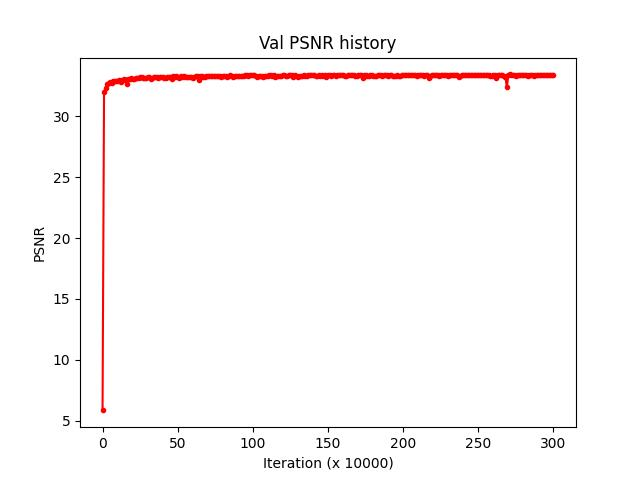

The testing results PSNR(dB) and SSIM on Set5 and Set14 is shown in the table below:

| Dataset      | Bilinear |  Bicubic   | FSRCNN     |
| :---        |    :----:   |     :----:  |  ---: |
|       |  PSNR/SSIM      | PSNR/SSIM   |PSNR/SSIM |
| Set5      |    32.23/0.9196   | 34.18/0.9423   |37.09/0.9616  |
| Set14   | 28.94/0.8534       | 30.34/0.8890     | 32.44/0.9179     |

Qualitative results are shown below (The order is low-resolution image, high-resolution image, bilinear upsampling, bicubic upsampling, FSRCNN:
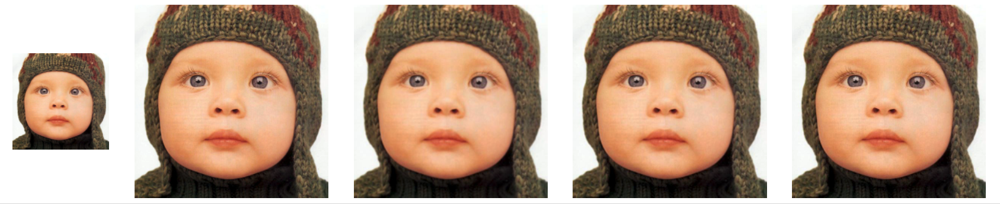

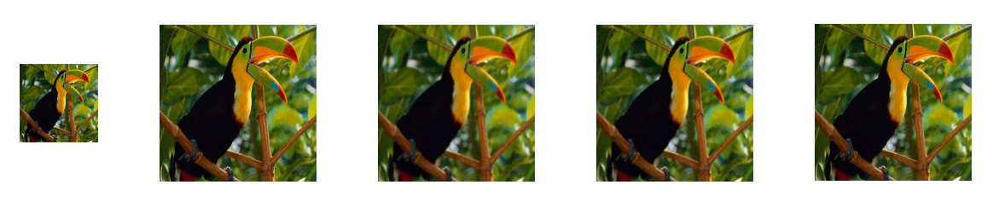

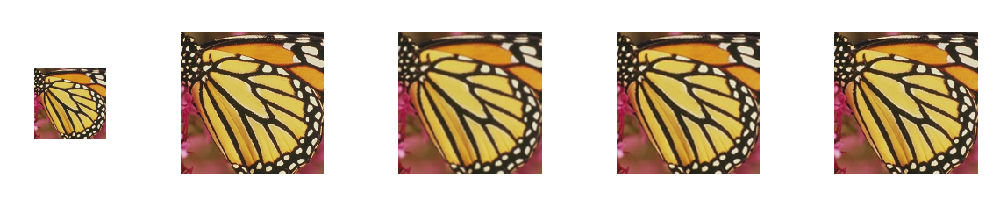

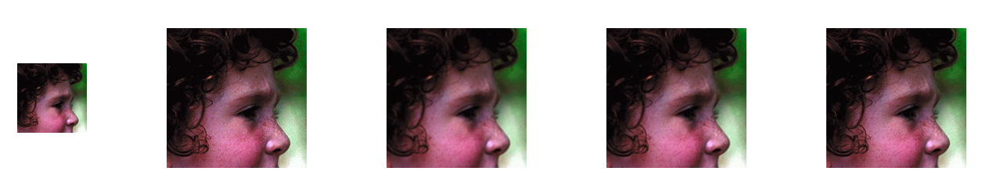

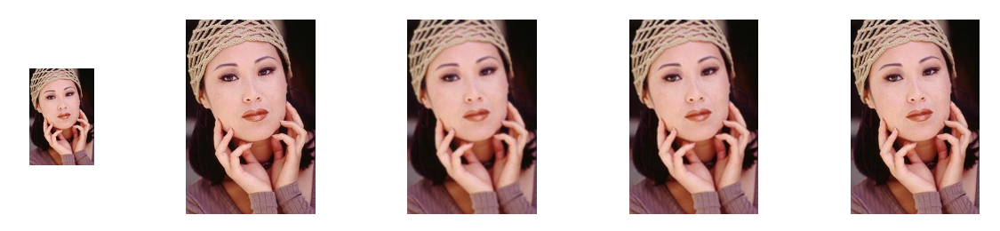

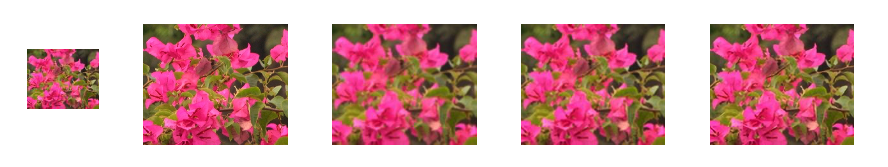

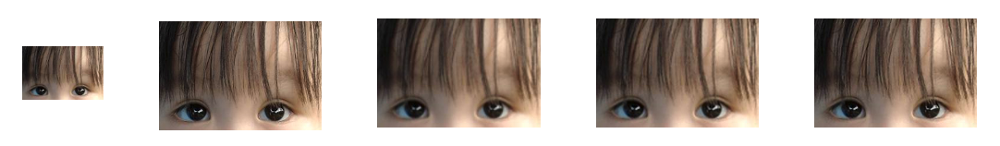

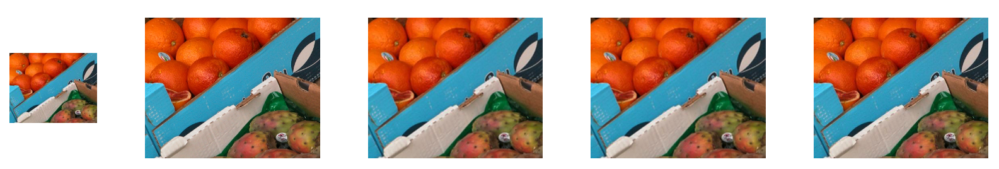

#### Upscale factor 3

The training loss curve and validation PSNR curve are shown below:
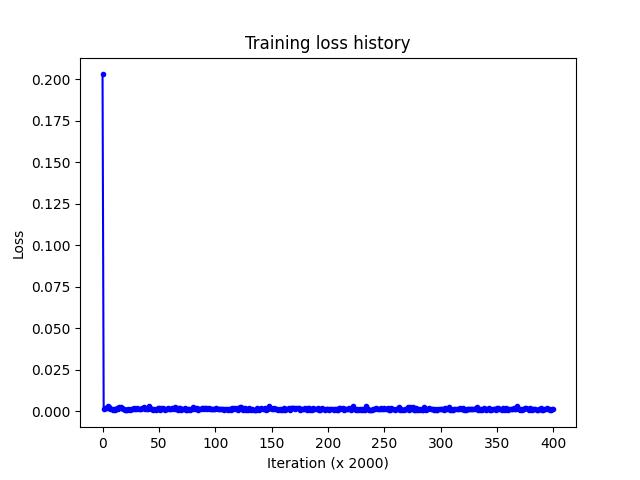

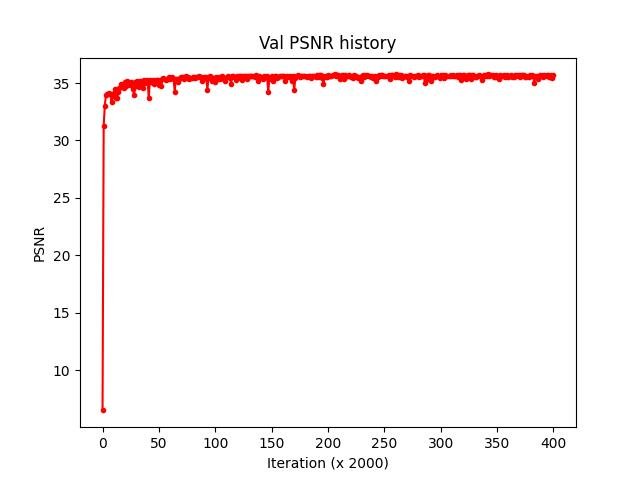

The testing results PSNR(dB) and SSIM on Set5 and Set14 is shown in the table below:

| Dataset      | Bilinear |  Bicubic   | FSRCNN     |
| :---        |    :----:   |     :----:  |  ---: |
|       |  PSNR/SSIM      | PSNR/SSIM   |PSNR/SSIM |
| Set5      |    29.51/0.8630   | 30.72/0.8872   |32.97/0.9212  |
| Set14   | 26.73/0.7724       | 27.53/0.8020     | 29.13/0.8402     |

Qualitative results are shown below (The order is low-resolution image, high-resolution image, bilinear upsampling, bicubic upsampling, FSRCNN:
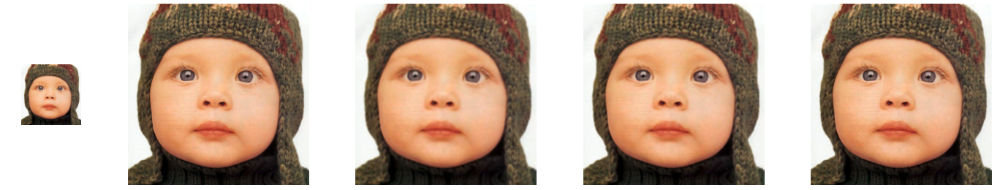                

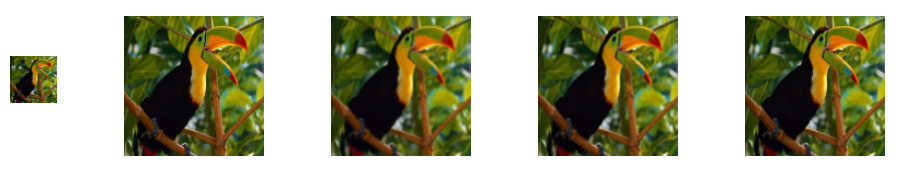

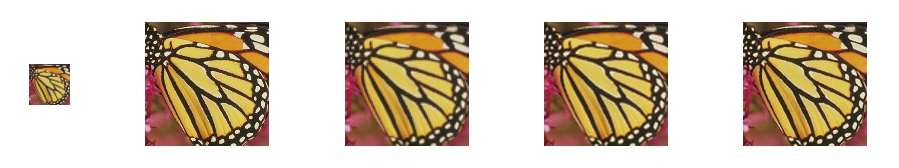

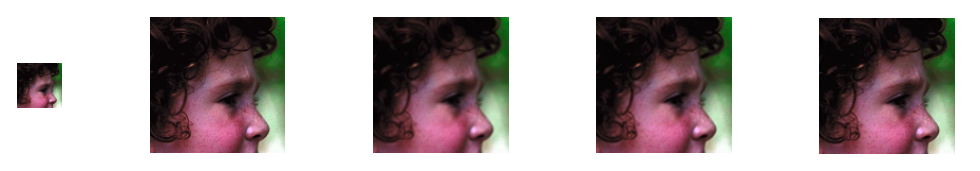

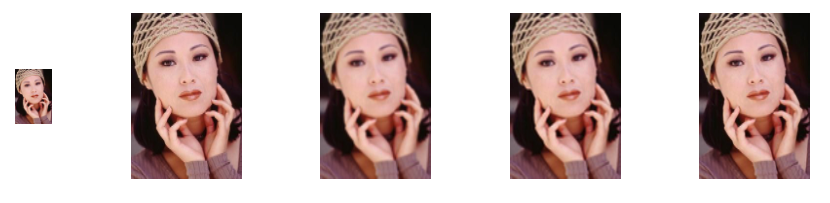

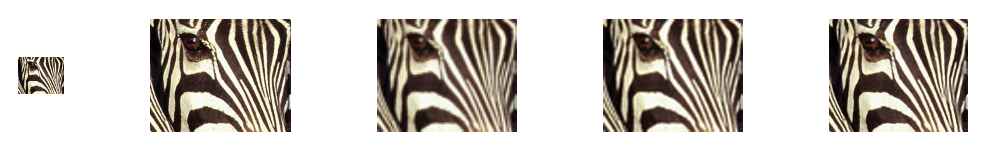

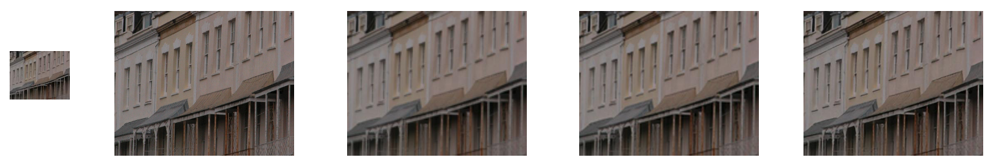

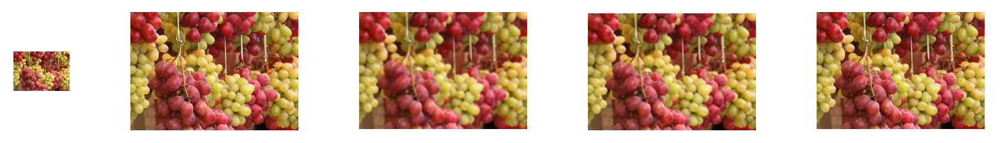

#### Upscale factor 4

The training loss curve and validation PSNR curve are shown below:
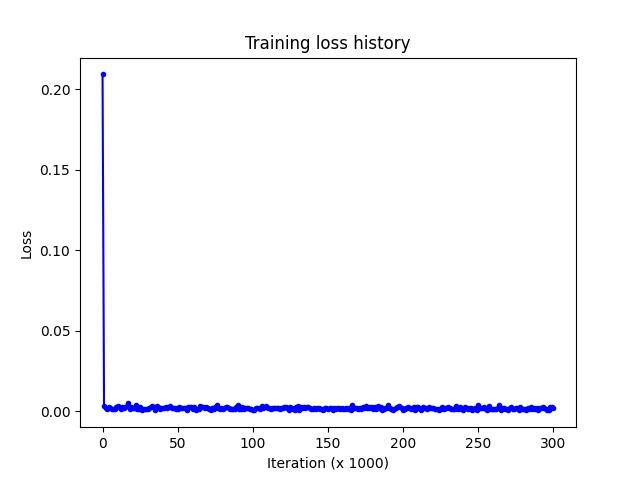

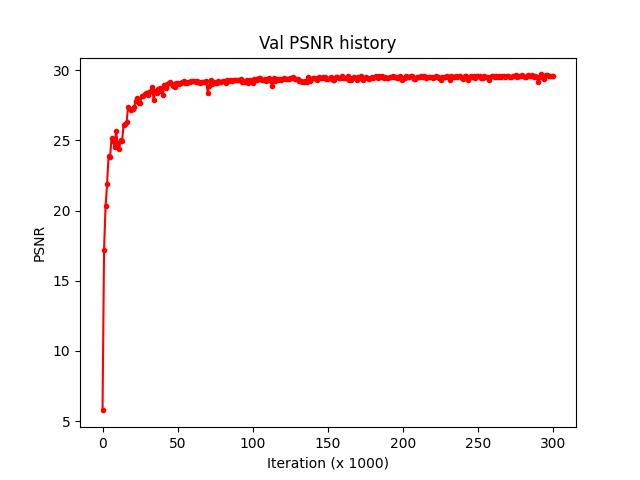

The testing results PSNR(dB) and SSIM on Set5 and Set14 is shown in the table below:

| Dataset      | Bilinear |  Bicubic   | FSRCNN     |
| :---        |    :----:   |     :----:  |  ---: |
|       |  PSNR/SSIM      | PSNR/SSIM   |PSNR/SSIM |
| Set5      |    27.53/0.7989   | 28.72/0.8309   |30.47/0.8721  |
| Set14   | 25.21/0.6962       | 25.95/0.7293     | 27.28/0.7689     |

Qualitative results are shown below (The order is low-resolution image, high-resolution image, bilinear upsampling, bicubic upsampling, FSRCNN:
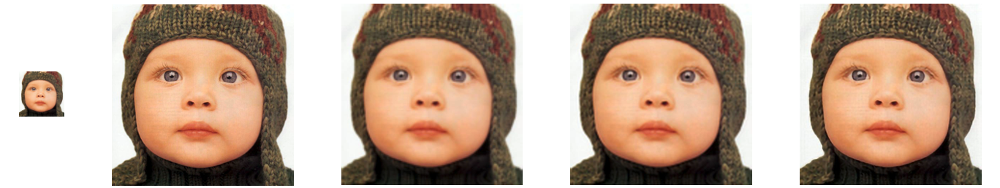

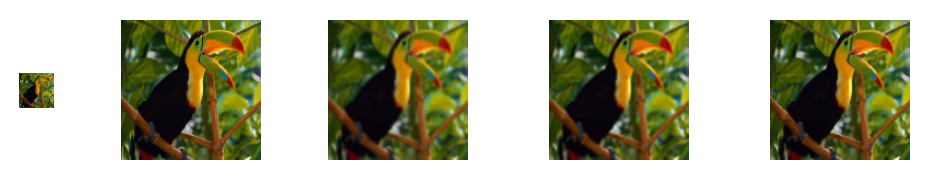

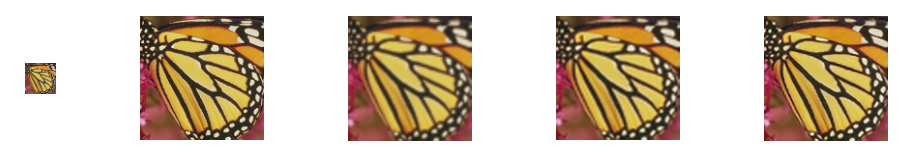

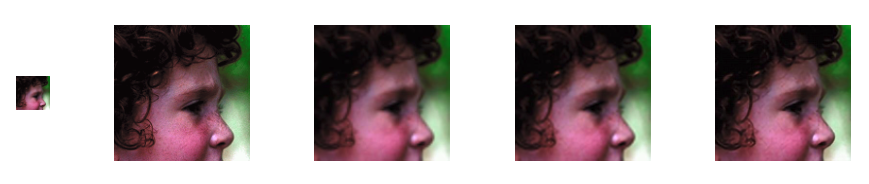

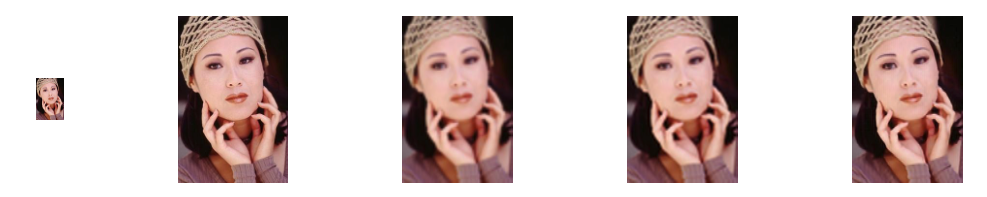

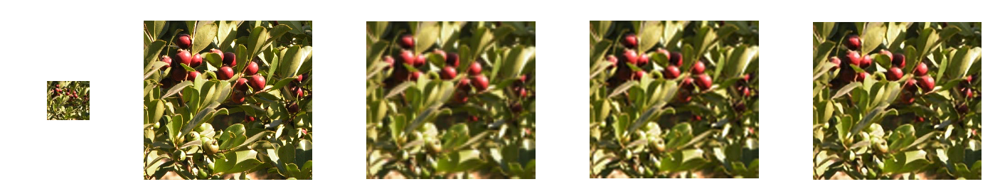

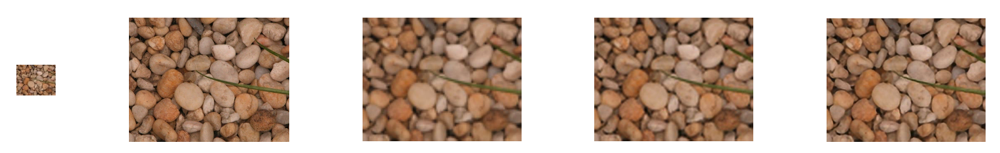

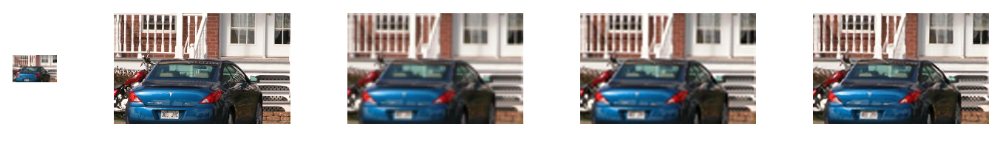